In [50]:
import random

In [51]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
np.random.seed(42)
%matplotlib inline

In [52]:
# from google.colab import drive
# drive.mount('/content/drive')

In [53]:
data =pd.read_csv('/content/sample_data/Hate_Speech_Detection.csv')
data.head()

,Platform,Comment,Hateful
0,Reddit,Damn I thought they had strict gun laws in Ger...,0
1,Reddit,I dont care about what it stands for or anythi...,0
2,Reddit,It's not a group it's an idea lol,0
3,Reddit,So it's not just America!,0
4,Reddit,The dog is a spectacular dancer considering he...,0


In [54]:
data['Hateful'].value_counts(normalize = True)

0    0.8
1    0.2
Name: Hateful, dtype: float64

In [55]:
import string
import nltk

In [56]:
## text preprocessing

from nltk.corpus import stopwords
def text_process(mess):
    """
    Takes in a string of text, then performs the following:
    1. Remove all punctuation
    2. Remove all stopwords
    3. Returns a list of the cleaned text
    """
    # Check characters to see if they are in punctuation
    nopunc = [char for char in mess if char not in string.punctuation]

    # Join the characters again to form the string.
    nopunc = ''.join(nopunc)
    
    # Now just remove any stopwords
    return [''.join(word) for word in nopunc.split() if word.lower() not in stopwords.words('english')]

In [57]:
# Creating balanced dataset

data_hate = data[data['Hateful']==1]
data_no_hate = data[data['Hateful']==0]

data_no_hate_downsampled = data_no_hate.sample(data_hate.shape[0])

data_balanced = pd.concat([data_no_hate_downsampled, data_hate], ignore_index=True)
print(data_balanced.shape)
print("Distribution after balancing dataset", data_balanced['Hateful'].value_counts(normalize = True))

(1200, 3)
Distribution after balancing dataset 0    0.5
1    0.5
Name: Hateful, dtype: float64


In [58]:
import nltk
nltk.download('stopwords')
data_balanced['Comment'] = data_balanced['Comment'].apply(text_process)

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [59]:
def listToString(s): 
    str1 = " " 
    return (str1.join(s))

In [60]:
data_balanced['Comment'] = data_balanced['Comment'].apply(listToString)

In [61]:
data_balanced.head()

,Platform,Comment,Hateful
0,4Chan,totally feasible write enough asm connect inte...,0
1,4Chan,camped right took shat river,0
2,Twitter,study watch fucking Netflix drink ice coffee,0
3,4Chan,Whats longest time youve gone without internet...,0
4,4Chan,ya rlly get exempt national laws build things ...,0


In [62]:
# create a list of list words stored in l1 of balanced dataset
list_of_sent = (data_balanced['Comment'].tolist())

#print(list_of_sent)

l1 = []
for i in list_of_sent:
  a = i.split(' ')
  l1.append(a)


In [63]:
word = []
for lt in l1:
  word.extend(lt)
#print(word)

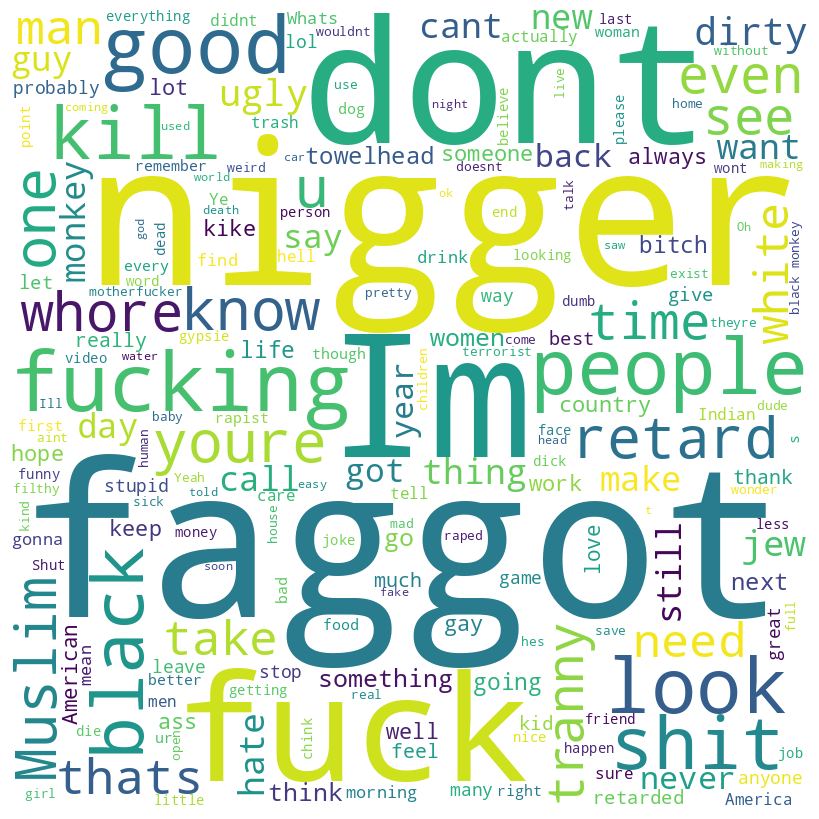

In [64]:
# create a WordCloud object
from wordcloud import WordCloud
wordcloud = WordCloud(width=800, height=800, background_color='white').generate(' '.join(word))

# plot the WordCloud image
plt.figure(figsize=(8, 8), facecolor=None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad=0)
  
# display the plot
plt.show()

In [65]:
# !pip install lime
# !pip install -U scikit-learn

from lime.lime_text import LimeTextExplainer
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics import classification_report
import matplotlib.pyplot as plt
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
import warnings
warnings.filterwarnings('ignore')

# Random Forest Classifier for Prediction

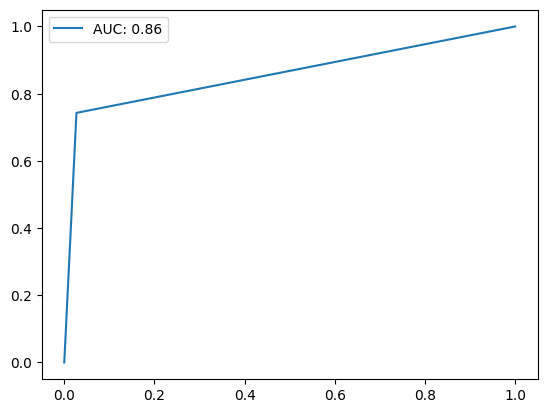

In [66]:
tfidf_vectorizer = TfidfVectorizer()

# fit and transform the text data
X = tfidf_vectorizer.fit_transform(data_balanced['Comment'])
y = data_balanced['Hateful']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 42)

rf = RandomForestClassifier(n_estimators=10, random_state=42)
rf.fit(X_train, y_train)

pred_rf = rf.predict(X_test)
class_rep_rf = classification_report(y_test, pred_rf)

tpr, fpr, thr = roc_curve(y_test, pred_rf)
roc_auc = roc_auc_score(y_test, pred_rf)
plt.plot(tpr, fpr, label=f"AUC: {round(roc_auc, 2)}")
plt.legend()
plt.show()

In [67]:
print("Classfication Report using Random Forest Classifier trained on balanced dataset is : \n\n", class_rep_rf)

Classfication Report using Random Forest Classifier trained on balanced dataset is : 

               precision    recall  f1-score   support

           0       0.80      0.97      0.88       185
           1       0.96      0.74      0.84       175

    accuracy                           0.86       360
   macro avg       0.88      0.86      0.86       360
weighted avg       0.88      0.86      0.86       360



# Prediction Explaination Using LIME for Random Forest Classifier

In [68]:
Xhs_train, Xhs_test, yhs_train, yhs_test = train_test_split(data_balanced['Comment'], data_balanced['Hateful'], 
                                                            test_size = 0.3, random_state = 42)

In [69]:
rf1 = RandomForestClassifier(n_estimators=10, random_state=42)
vectorizer = TfidfVectorizer()
p_rf = make_pipeline(vectorizer, rf1)
p_rf.fit(Xhs_train,yhs_train)

Pipeline(steps=[('tfidfvectorizer', TfidfVectorizer()),
                ('randomforestclassifier',
                 RandomForestClassifier(n_estimators=10, random_state=42))])

In [70]:
x_0 = 'damn thought strict gun laws Germany'
x_0_true_label = 0
explainer = LimeTextExplainer(class_names = [0,1])
exp = explainer.explain_instance(x_0, p_rf.predict_proba, num_features=10)
print('R2 score: {:.3f}'.format(exp.score))
exp.show_in_notebook(text=True)

R2 score: 1.000


In [71]:
x_1 = 'We should send them All back to africa'
x_1_true_label = 1
exp = explainer.explain_instance(x_1, p_rf.predict_proba, num_features=10)
print('R2 score: {:.3f}'.format(exp.score))
exp.show_in_notebook(text=True)

R2 score: 0.984


In [72]:
x_2 = 'dog spectacular dancer considering two left feet'
x_2_true_label = 0
exp = explainer.explain_instance(x_2, p_rf.predict_proba, num_features=10)
print('R2 score: {:.3f}'.format(exp.score))
exp.show_in_notebook(text=True)

R2 score: 1.000


# Support Vector Classifier for Prediction

Classfication Report using Support Vector Machine Classifier trained on balanced dataset is : 

               precision    recall  f1-score   support

           0       0.80      0.95      0.87       185
           1       0.94      0.75      0.83       175

    accuracy                           0.85       360
   macro avg       0.87      0.85      0.85       360
weighted avg       0.87      0.85      0.85       360



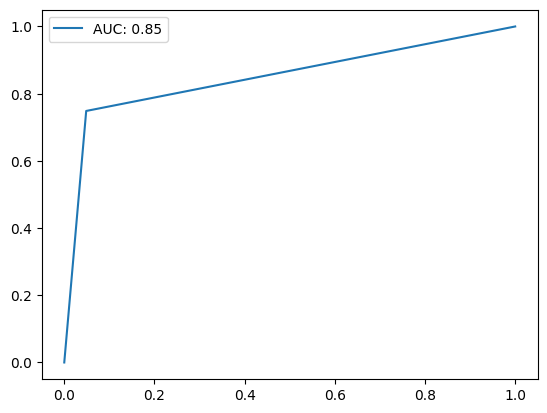

In [73]:
tfidf_vectorizer = TfidfVectorizer()
from sklearn import svm
clf = svm.SVC().fit(X_train, y_train)
pred_svc = clf.predict(X_test)
class_rep_svc = classification_report(y_test, pred_svc)
print("Classfication Report using Support Vector Machine Classifier trained on balanced dataset is : \n\n", class_rep_svc)


tpr, fpr, thr = roc_curve(y_test, pred_svc)
roc_auc = roc_auc_score(y_test, pred_svc)
plt.plot(tpr, fpr, label=f"AUC: {round(roc_auc, 2)}")
plt.legend()
plt.show()

# Prediction Explaination Using LIME for Support Vector Classifier

In [74]:
clf = svm.SVC(probability=True)
vectorizer = TfidfVectorizer()
p_svc = make_pipeline(vectorizer, clf)
p_svc.fit(Xhs_train,yhs_train)

x_0 = 'damn thought strict gun laws Germany'
x_0_true_label = 0

explainer = LimeTextExplainer(class_names = [0,1])
exp = explainer.explain_instance(x_0, p_svc.predict_proba, num_features=10)
print('R2 score: {:.3f}'.format(exp.score))
exp.show_in_notebook(text=True)

R2 score: 0.686


In [75]:
x_1 = 'We should send them All back to africa'
x_1_true_label = 1
exp = explainer.explain_instance(x_1, p_svc.predict_proba, num_features=10)
print('R2 score: {:.3f}'.format(exp.score))
exp.show_in_notebook(text=True)

R2 score: 0.946


In [76]:
x_2 = 'dog spectacular dancer considering two left feet'
x_2_true_label = 0
exp = explainer.explain_instance(x_2, p_svc.predict_proba, num_features=10)
print('R2 score: {:.3f}'.format(exp.score))
exp.show_in_notebook(text=True)

R2 score: 0.922


# Neural Network Classifier for Prediction

Classfication Report using Support Vector Machine Classifier trained on balanced dataset is : 

               precision    recall  f1-score   support

           0       0.88      0.82      0.85       185
           1       0.82      0.88      0.85       175

    accuracy                           0.85       360
   macro avg       0.85      0.85      0.85       360
weighted avg       0.85      0.85      0.85       360



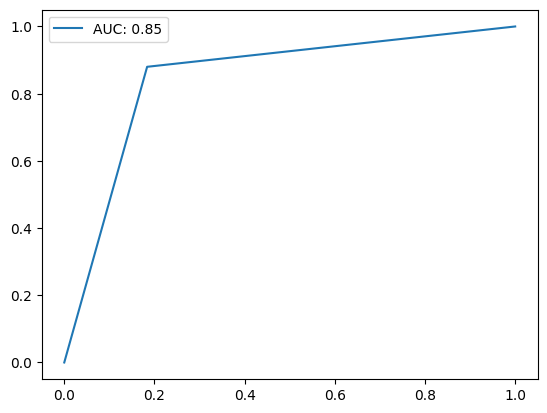

In [77]:
from sklearn.neural_network import MLPClassifier
clf_nn = MLPClassifier()
tfidf_vectorizer = TfidfVectorizer()
clf_nn.fit(X_train, y_train)
pred_nn = clf_nn.predict(X_test)
class_rep_nn = classification_report(y_test, pred_nn)
print("Classfication Report using Support Vector Machine Classifier trained on balanced dataset is : \n\n", class_rep_nn)

tpr, fpr, thr = roc_curve(y_test, pred_nn)
roc_auc = roc_auc_score(y_test, pred_nn)
plt.plot(tpr, fpr, label=f"AUC: {round(roc_auc, 2)}")
plt.legend()
plt.show()

# Prediction Explaination Using LIME for Neural Network Classifier

In [78]:
clf_nn = MLPClassifier()
vectorizer = TfidfVectorizer()
p_nn = make_pipeline(vectorizer, clf_nn)
p_nn.fit(Xhs_train,yhs_train)

x_0 = 'damn thought strict gun laws Germany'
x_0_true_label = 0

explainer = LimeTextExplainer(class_names = [0,1])
exp = explainer.explain_instance(x_0, p_nn.predict_proba, num_features=10)
print('R2 score: {:.3f}'.format(exp.score))
exp.show_in_notebook(text=True)

R2 score: 0.729


In [79]:
x_1 = 'We should send them All back to africa'
x_1_true_label = 1
exp = explainer.explain_instance(x_1, p_nn.predict_proba, num_features=10)
print('R2 score: {:.3f}'.format(exp.score))
exp.show_in_notebook(text=True)

R2 score: 0.918


In [80]:
x_2 = 'dog spectacular dancer considering two left feet'
x_2_true_label = 0
exp = explainer.explain_instance(x_2, p_nn.predict_proba, num_features=10)
print('R2 score: {:.3f}'.format(exp.score))
exp.show_in_notebook(text=True)

R2 score: 0.942


In [81]:
df = pd.DataFrame()
df['true_test_label'] = y_test
df['prediction_rf'] = pred_rf
df['prediction_svc'] = pred_svc
df['prediction_nn'] = pred_nn

In [82]:
df.head()

,true_test_label,prediction_rf,prediction_svc,prediction_nn
1178,1,1,0,1
865,1,0,0,1
101,0,0,0,0
439,0,0,0,0
58,0,0,0,0


In [83]:
df.shape

(360, 4)

In [84]:
fin_dataset = pd.merge(data_balanced, df, left_index=True, right_index=True)

In [85]:
fin_dataset.drop(['Hateful'], axis = 1, inplace = True)

In [86]:
fin_dataset.tail(10)

,Platform,Comment,true_test_label,prediction_rf,prediction_svc,prediction_nn
1168,4Chan,fuck saying even human Dirty towelhead muslim ...,1,1,1,1
1169,4Chan,fuck dirty chinks anyway fuck back china hell ...,1,1,1,1
1172,4Chan,stupid fucking faggot boomer parents low iq re...,1,1,1,1
1177,4Chan,btw guys completely cucked muslim desert goatf...,1,1,0,1
1178,4Chan,reality neither Christians Muslims want anythi...,1,1,0,1
1186,4Chan,Im killin Muslims like suck dicks,1,1,0,1
1190,4Chan,Except 49 faggots one coon negro,1,1,1,1
1191,4Chan,Keep coping wont shit nigger,1,1,1,1
1192,4Chan,theyre sub 70 IQ savages need exterminated qui...,1,0,0,0
1193,4Chan,tell youre sandnigger abdul,1,0,1,1


In [87]:
print("Total incorrect prediction using Random Forest Classifier : ")
print(fin_dataset[fin_dataset['true_test_label'] != fin_dataset['prediction_rf']]['Platform'].value_counts())
print("Fraction of Platforms in incorrect prediction of Random Forest Classifier : ")
print(fin_dataset[fin_dataset['true_test_label'] != fin_dataset['prediction_rf']]['Platform'].value_counts(normalize = True))

print("Total Correct prediction using Random Forest Classifier : ")
print(fin_dataset[fin_dataset['true_test_label'] == fin_dataset['prediction_rf']]['Platform'].value_counts())
print("Fraction of Platforms in correct prediction of Random Forest Classifier : ")
print(fin_dataset[fin_dataset['true_test_label'] == fin_dataset['prediction_rf']]['Platform'].value_counts(normalize = True))

Total incorrect prediction using Random Forest Classifier : 
4Chan      21
Reddit     21
Twitter     8
Name: Platform, dtype: int64
Fraction of Platforms in incorrect prediction of Random Forest Classifier : 
4Chan      0.42
Reddit     0.42
Twitter    0.16
Name: Platform, dtype: float64
Total Correct prediction using Random Forest Classifier : 
Twitter    112
Reddit     105
4Chan       93
Name: Platform, dtype: int64
Fraction of Platforms in correct prediction of Random Forest Classifier : 
Twitter    0.36129
Reddit     0.33871
4Chan      0.30000
Name: Platform, dtype: float64


In [88]:
print("Total incorrect prediction using Support Vector Machine Classifier : ")
print(fin_dataset[fin_dataset['true_test_label'] != fin_dataset['prediction_svc']]['Platform'].value_counts())
print("Fraction of Platforms in incorrect prediction of Support Vector Machine Classifier : ")
print(fin_dataset[fin_dataset['true_test_label'] != fin_dataset['prediction_svc']]['Platform'].value_counts(normalize = True))

print("Total Correct prediction using Support Vector Machine Classifier : ")
print(fin_dataset[fin_dataset['true_test_label'] == fin_dataset['prediction_svc']]['Platform'].value_counts())
print("Fraction of Platforms in correct prediction of Support Vector Machine Classifier : ")
print(fin_dataset[fin_dataset['true_test_label'] == fin_dataset['prediction_svc']]['Platform'].value_counts(normalize = True))

Total incorrect prediction using Support Vector Machine Classifier : 
4Chan      22
Reddit     20
Twitter    11
Name: Platform, dtype: int64
Fraction of Platforms in incorrect prediction of Support Vector Machine Classifier : 
4Chan      0.415094
Reddit     0.377358
Twitter    0.207547
Name: Platform, dtype: float64
Total Correct prediction using Support Vector Machine Classifier : 
Twitter    109
Reddit     106
4Chan       92
Name: Platform, dtype: int64
Fraction of Platforms in correct prediction of Support Vector Machine Classifier : 
Twitter    0.355049
Reddit     0.345277
4Chan      0.299674
Name: Platform, dtype: float64


In [89]:
print("Total incorrect prediction using Neural Network Classifier : ")
print(fin_dataset[fin_dataset['true_test_label'] != fin_dataset['prediction_nn']]['Platform'].value_counts())
print("Fraction of Platforms in incorrect prediction of Neural Network Classifier : ")
print(fin_dataset[fin_dataset['true_test_label'] != fin_dataset['prediction_nn']]['Platform'].value_counts(normalize = True))

print("Total Correct prediction using Neural Network Classifier : ")
print(fin_dataset[fin_dataset['true_test_label'] == fin_dataset['prediction_nn']]['Platform'].value_counts())
print("Fraction of Platforms in correct prediction of Neural Network Classifier : ")
print(fin_dataset[fin_dataset['true_test_label'] == fin_dataset['prediction_nn']]['Platform'].value_counts(normalize = True))

Total incorrect prediction using Neural Network Classifier : 
4Chan      21
Reddit     19
Twitter    15
Name: Platform, dtype: int64
Fraction of Platforms in incorrect prediction of Neural Network Classifier : 
4Chan      0.381818
Reddit     0.345455
Twitter    0.272727
Name: Platform, dtype: float64
Total Correct prediction using Neural Network Classifier : 
Reddit     107
Twitter    105
4Chan       93
Name: Platform, dtype: int64
Fraction of Platforms in correct prediction of Neural Network Classifier : 
Reddit     0.350820
Twitter    0.344262
4Chan      0.304918
Name: Platform, dtype: float64


## Conclusion
According to Random Forest, Support Vector Machine and Multi-layer Perceptron Classfiers highest error seen in 4Chan and lowest error in Twitter platofrm.